In [20]:
import numpy as np
import pandas as pd
import re

import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.decomposition import NMF, TruncatedSVD
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

In [ ]:
from sklearn.feature_extraction.text import 

### To-do list
- topics modeling
- clustering
- visualization

### Import data from EDA

In [5]:
df = pd.read_pickle('cleaned_df.pkl')
df.head()

,Age,ReviewText,Rating,RecommendedIND,PositiveFeedbackCount,DivisionName,DepartmentName,ClassName,CombinedText
0,33,Absolutely wonderful - silky and sexy and comf...,4,1,0,Initmates,Intimate,Intimates,Absolutely wonderful - silky and sexy and com...
1,34,Love this dress! it's sooo pretty. i happene...,5,1,4,General,Dresses,Dresses,Love this dress! it's sooo pretty. i happen...
2,60,I had such high hopes for this dress and reall...,3,0,0,General,Dresses,Dresses,Some major design flaws I had such high hopes ...
3,50,"I love, love, love this jumpsuit. it's fun, fl...",5,1,0,General Petite,Bottoms,Pants,"My favorite buy! I love, love, love this jumps..."
4,47,This shirt is very flattering to all due to th...,5,1,6,General,Tops,Blouses,Flattering shirt This shirt is very flattering...


### Remove some frequent words

In [7]:
words_to_remove = ['love', 'dress', 'dresses']
text = 'I love things about dresses but not dress.'

import re
pattern = [f'(\\b{word}\\b)' for word in words_to_remove]
pattern = '|'.join(pattern)
re.sub(pattern, '', text)

'I  things about  but not .'

In [8]:
df['ReviewTextLower'] = df.ReviewText

In [9]:
df['ReviewTextLower'] = df.ReviewTextLower.str.lower()

In [10]:
df['ReviewTextLower'].replace(to_replace=pattern, value='', regex=True, inplace=True)

In [99]:
count_vectorizer = CountVectorizer(ngram_range=(1, 3),  
                                   stop_words='english', 
                                   token_pattern="\\b[a-z][a-z]+\\b",
                                   lowercase=True,
                                   max_df = 0.6, max_features=4000)
tfidf_vectorizer = TfidfVectorizer(ngram_range=(2, 3),  
                                   stop_words='english', 
                                   token_pattern="\\b[a-z][a-z]+\\b",
                                   lowercase=True,
                                   max_df = 0.6, max_features=4000)

cv_data = count_vectorizer.fit_transform(df.ReviewTextLower)
tfidf_data = tfidf_vectorizer.fit_transform(df.ReviewTextLower)

### Try Topic Modelings

In [14]:
# def functions for topic modelings
def display_topics(model, feature_names, no_top_words, topic_names=None):
    for ix, topic in enumerate(model.components_):
        if not topic_names or not topic_names[ix]:
            print("\nTopic ", ix)
        else:
            print("\nTopic: '",topic_names[ix],"'")
        print(", ".join([feature_names[i]
                        for i in topic.argsort()[:-no_top_words - 1:-1]]))
        
def display_topics2(model, feature_names, no_top_words=10, topic_names = None):
    for index, topic in enumerate(model.components_):
        if not topic_names or not topic_names[index]:
            print(f"\nTopic {index}")
        else:
            print(f"\nTopic {topic_names[index]}:")
        msg = ", ".join([f'{feature_names[i]} ({topic[i]:6.4f})' 
                             for i in topic.argsort()[:-no_top_words-1:-1]])
        print(msg)

In [56]:
# try using 50 dimensions
n_comp = 50
lsa_tfidf = TruncatedSVD(n_components=n_comp)
lsa_cv = TruncatedSVD(n_components=n_comp)
nmf_tfidf = NMF(n_components=n_comp)
nmf_cv = NMF(n_components=n_comp)

lsa_tfidf_data = lsa_tfidf.fit_transform(tfidf_data)
lsa_cv_data = lsa_cv.fit_transform(cv_data)
nmf_tfidf_data = nmf_tfidf.fit_transform(tfidf_data)
nmf_cv_data = nmf_cv.fit_transform(cv_data)

In [57]:
# topic modeling with lsa and tfidf
display_topics2(lsa_tfidf, tfidf_vectorizer.get_feature_names(),8)


Topic 0
true size (0.7192), fits true (0.2980), fits true size (0.2964), fit true (0.1697), fit true size (0.1690), looks great (0.0992), runs true (0.0958), runs true size (0.0944)

Topic 1
true size (0.3337), fits true (0.2025), fits true size (0.2014), fit true size (0.0718), fit true (0.0709), runs true size (0.0276), runs true (0.0247), true size flattering (0.0149)

Topic 2
looks great (0.8906), great jeans (0.1599), looks great jeans (0.1450), skinny jeans (0.0809), great skinny (0.0551), comfortable looks (0.0479), looks great skinny (0.0469), comfortable looks great (0.0468)

Topic 3
super cute (0.9409), highly recommend (0.0769), cute comfortable (0.0652), cute flattering (0.0517), super cute flattering (0.0505), cute material (0.0355), look great (0.0352), cute comfy (0.0272)

Topic 4
fits true (0.4713), fits true size (0.4647), fits perfectly (0.1237), usually wear (0.0911), runs large (0.0666), looked like (0.0535), size small (0.0510), small fits (0.0466)

Topic 5
fit pe

In [16]:
# topic modeling with lsa and countvectorizer
display_topics2(lsa_cv, count_vectorizer.get_feature_names(),10)


Topic 0
size (0.3559), fit (0.2668), like (0.2594), wear (0.2185), just (0.1979), great (0.1856), small (0.1772), fabric (0.1560), color (0.1481), ordered (0.1376)

Topic 1
size (0.7700), small (0.1356), true (0.1063), true size (0.1032), fit (0.0917), ordered (0.0893), size small (0.0494), large (0.0436), usual (0.0427), runs (0.0416)

Topic 2
like (0.6521), size (0.1364), look (0.1043), really (0.0914), just (0.0751), looked (0.0571), model (0.0542), fabric (0.0527), look like (0.0498), didn (0.0474)

Topic 3
wear (0.5233), small (0.4081), medium (0.1465), usually (0.1049), large (0.1010), runs (0.0785), usually wear (0.0760), shirt (0.0692), fits (0.0607), retailer (0.0530)

Topic 4
fit (0.5410), small (0.4336), medium (0.1533), ordered (0.1247), just (0.1090), xs (0.0945), large (0.0871), usually (0.0783), petite (0.0709), waist (0.0581)

Topic 5
just (0.6467), fabric (0.1602), color (0.1105), right (0.1011), beautiful (0.0919), really (0.0901), soft (0.0723), flattering (0.0687),

In [17]:
# topic modeling with nmf and tfidf
display_topics2(nmf_tfidf, tfidf_vectorizer.get_feature_names(),10)


Topic 0
like (2.5308), look (1.3775), really (1.3128), fabric (1.1826), nice (0.8023), good (0.7609), looks (0.7597), material (0.6801), model (0.5913), pretty (0.5628)

Topic 1
wear (2.1296), perfect (1.6434), summer (0.8048), fall (0.4813), easy (0.3732), bought (0.3682), wait (0.3537), spring (0.3357), wait wear (0.3067), light (0.3060)

Topic 2
size (1.5858), true (1.2507), true size (1.2326), fits (0.5408), fits true (0.5220), fit true (0.2438), runs true (0.2037), size fits (0.1451), usual (0.1114), size size (0.1097)

Topic 3
small (2.0832), medium (0.9048), usually (0.4495), ordered (0.4375), size small (0.3880), small medium (0.3003), size (0.2861), ordered small (0.2700), extra (0.2590), usually wear (0.2537)

Topic 4
shirt (2.6723), white (0.2181), great shirt (0.1486), shirt great (0.1293), cute shirt (0.1287), shirts (0.1227), like shirt (0.1154), bought shirt (0.1141), boxy (0.1128), shirt runs (0.1096)

Topic 5
great (2.4087), looks great (0.5386), looks (0.5052), fits 

In [18]:
# topic modeling with nmf and countvectorizer
display_topics2(nmf_cv, count_vectorizer.get_feature_names(),10)


Topic 0
flattering (5.2352), comfortable (5.2316), soft (4.7632), bought (3.2933), material (2.8323), pants (2.3196), super (2.2999), jeans (2.2132), cute (1.5795), colors (1.5101)

Topic 1
size (8.8916), true (1.3392), true size (1.2366), usual (0.4829), fits (0.4631), usual size (0.4094), smaller (0.3531), size small (0.3256), ordered size (0.3130), normal (0.3083)

Topic 2
like (7.6427), looks (0.9452), feel (0.5449), model (0.4726), looks like (0.4336), don (0.4022), feel like (0.3996), looked (0.3832), material (0.3193), look like (0.3123)

Topic 3
wear (8.8244), usually wear (0.8764), usually (0.8174), bought (0.4532), bra (0.4187), wait (0.4139), wear size (0.3896), normally wear (0.3867), work (0.3862), underneath (0.3859)

Topic 4
fit (10.0925), fit perfectly (0.8797), perfectly (0.8728), waist (0.4787), size fit (0.4145), jeans (0.3730), tight (0.3628), loose (0.3547), pants (0.3526), fit great (0.3367)

Topic 5
just (8.1305), right (1.2183), just right (0.6877), didn (0.409

# SS

In [187]:
# initialize vectorizers
count_vectorizer = CountVectorizer(ngram_range=(1, 2),  
                                   stop_words='english', 
                                   token_pattern="\\b[a-z][a-z]+\\b",
                                   lowercase=True,
                                   max_df = 0.6, max_features=4000)
tfidf_vectorizer = TfidfVectorizer(ngram_range=(1, 2),  
                                   stop_words='english', 
                                   token_pattern="\\b[a-z][a-z]+\\b",
                                   lowercase=True,
                                   max_df = 0.6, max_features=4000)

# transfomred my text data using vectorizers
cv_data = count_vectorizer.fit_transform(df.ReviewTextLower)
tfidf_data = tfidf_vectorizer.fit_transform(df.ReviewTextLower)

In [188]:
# initialized reducers with dimensions
n_comp = 5
lsa_tfidf = TruncatedSVD(n_components=n_comp)
lsa_cv = TruncatedSVD(n_components=n_comp)
nmf_tfidf = NMF(n_components=n_comp)
nmf_cv = NMF(n_components=n_comp)

# transformed my vectorizers data using reducers
lsa_tfidf_data = lsa_tfidf.fit_transform(tfidf_data)
lsa_cv_data = lsa_cv.fit_transform(cv_data)
nmf_tfidf_data = nmf_tfidf.fit_transform(tfidf_data)
nmf_cv_data = nmf_cv.fit_transform(cv_data)

In [189]:
# initialize standardscaler
from sklearn.preprocessing import StandardScaler
SS = StandardScaler()

# transform my reducer data using standardscaler
lsa_tfidf_data_sclaed = SS.fit_transform(lsa_tfidf_data)
lsa_cv_data_sclaed = SS.fit_transform(lsa_cv_data)
nmf_tfidf_data_scaled = SS.fit_transform(nmf_tfidf_data)
nmf_cv_data_scaled = SS.fit_transform(nmf_cv_data)

In [190]:
display_topics2(lsa_tfidf, tfidf_vectorizer.get_feature_names(),8)


Topic 0
size (0.2144), fit (0.1781), like (0.1731), great (0.1686), wear (0.1614), just (0.1463), small (0.1424), fabric (0.1303)

Topic 1
great (0.3626), jeans (0.1888), comfortable (0.1857), soft (0.1383), perfect (0.1153), looks (0.1123), sweater (0.1045), shirt (0.1035)

Topic 2
size (0.4088), true (0.2847), true size (0.2824), great (0.2181), fits (0.1759), perfect (0.1551), fits true (0.1095), comfortable (0.1074)

Topic 3
shirt (0.3469), small (0.3212), wear (0.2289), medium (0.2074), large (0.2057), cute (0.1860), runs (0.1457), usually (0.1121)

Topic 4
shirt (0.4203), true (0.2623), true size (0.2594), size (0.1864), looks (0.1372), cute (0.1303), fits (0.1280), like (0.1248)


In [173]:
#lsa = TruncatedSVD(n_components=50)
#lsa_tfidf_data = lsa.fit_transform(tfidf_data)
terms = tfidf_vectorizer.get_feature_names()

for i in range(0,10):
    word_list=[]
    print("Topic%d:"% i)
    for j in lsa_tfidf.components_.argsort()[i, -16:-1]:
        word_list.append(terms[j])
    print(word_list)

Topic0:
['soft', 'flattering', 'little', 'perfect', 'ordered', 'look', 'really', 'color', 'fabric', 'small', 'just', 'wear', 'great', 'like', 'fit']
Topic1:
['casual', 'summer', 'flattering', 'fall', 'color', 'pants', 'super', 'looks great', 'shirt', 'looks', 'perfect', 'sweater', 'soft', 'comfortable', 'jeans']
Topic2:
['fit', 'runs', 'medium', 'perfectly', 'jeans', 'wear', 'fits true size', 'fits true', 'comfortable', 'small', 'perfect', 'fits', 'great', 'true size', 'true']
Topic3:
['waist', 'look', 'fit true size', 'fit true', 'nice', 'fits', 'material', 'quality', 'fits true size', 'fits true', 'fabric', 'like', 'skirt', 'size', 'true size']
Topic4:
['super cute', 'super', 'large', 'material', 'soft', 'size', 'sweater', 'runs', 'fits true size', 'fits true', 'looks', 'fits', 'true size', 'true', 'cute']
Topic5:


IndexError: index 5 is out of bounds for axis 0 with size 5

In [191]:
SSEs = []
Sil_coefs = []
for k in range(2,10):
    km = KMeans(n_clusters=k, random_state=42)
    km.fit(lsa_tfidf_data_sclaed)
    labels = km.labels_
    Sil_coefs.append(silhouette_score(lsa_tfidf_data_sclaed, labels, metric='euclidean'))
    SSEs.append(km.inertia_) 

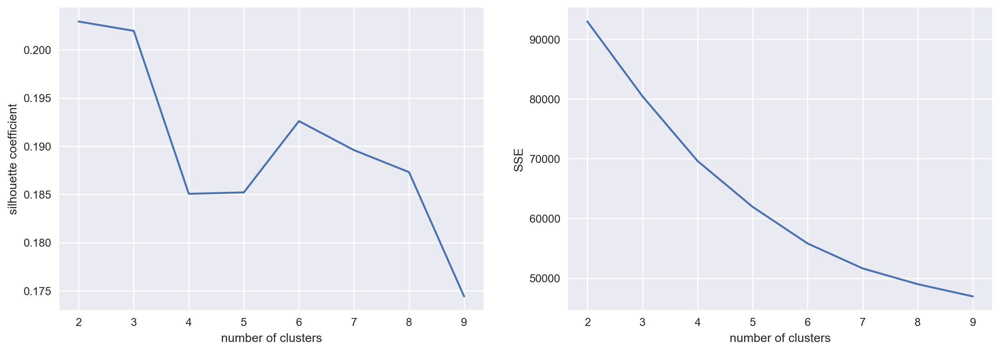

In [192]:
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(15,5), sharex=True, dpi=200)
k_clusters = range(2,10)
ax1.plot(k_clusters, Sil_coefs)
ax1.set_xlabel('number of clusters')
ax1.set_ylabel('silhouette coefficient')

# plot here on ax2
ax2.plot(k_clusters, SSEs)
ax2.set_xlabel('number of clusters')
ax2.set_ylabel('SSE');

In [193]:
inertia = [0,0]

for n_clusters in range(2, 25):
    km = KMeans(n_clusters = n_clusters)
    km.fit(lsa_tfidf_data_sclaed)
    msg = f"""# clusters: {n_clusters:2d}   Inertia: {km.inertia_:8.6f}"""
    inertia.append(km.inertia_)
    print(msg)

# clusters:  2   Inertia: 92972.077598
# clusters:  3   Inertia: 80459.934657
# clusters:  4   Inertia: 69626.502774
# clusters:  5   Inertia: 61948.765889
# clusters:  6   Inertia: 55806.711897
# clusters:  7   Inertia: 51634.094083
# clusters:  8   Inertia: 48993.779016
# clusters:  9   Inertia: 46956.358800
# clusters: 10   Inertia: 45080.665705
# clusters: 11   Inertia: 43518.160177
# clusters: 12   Inertia: 42020.310760
# clusters: 13   Inertia: 40671.608631
# clusters: 14   Inertia: 39573.995181
# clusters: 15   Inertia: 38496.390353
# clusters: 16   Inertia: 37521.916876
# clusters: 17   Inertia: 36626.791200
# clusters: 18   Inertia: 35809.944755
# clusters: 19   Inertia: 35109.734554
# clusters: 20   Inertia: 34330.192941
# clusters: 21   Inertia: 33670.545815
# clusters: 22   Inertia: 33117.017807
# clusters: 23   Inertia: 32588.684226
# clusters: 24   Inertia: 32081.945105


Text(0,0.5,'inertia scores')

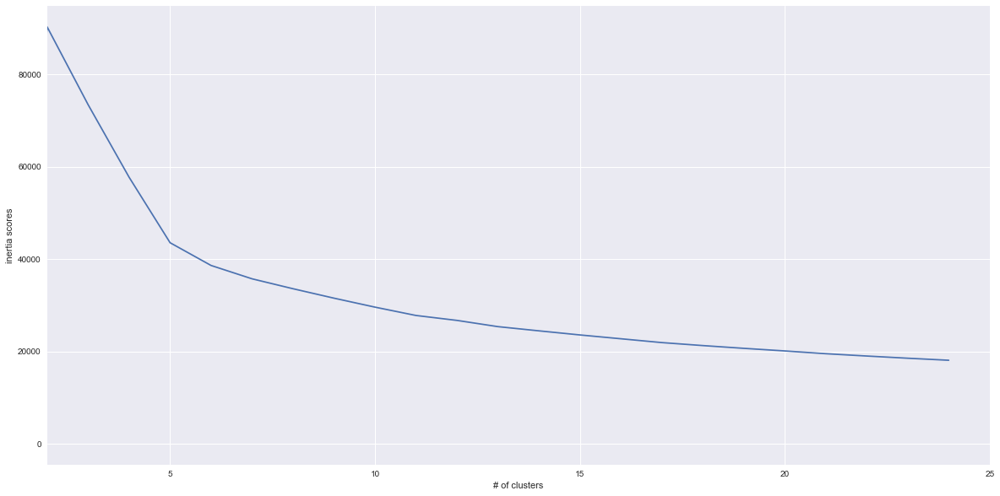

In [254]:
plt.figure(figsize=(20,10))
plt.plot(inertia)
plt.xlabel('# of clusters')
plt.xlim((2,25))
plt.ylabel('inertia scores')
#plt.ylim((650,1200))

In [195]:
# running cluster
k = 3
kmeans = KMeans(n_clusters=k, random_state=1)
kmeans.fit(lsa_tfidf_data_sclaed)
centers = kmeans.cluster_centers_.argsort()[:,::-1]
terms = tfidf_vectorizer.get_feature_names()

for i in range(0,k):
    word_list=[]
    print("cluster%d:"% i)
    for j in centers[i,:15]:
        word_list.append(terms[j])
    print(word_list) 

cluster0:
['able wear', 'absolutely', 'able', 'able try', 'absolute']
cluster1:
['able', 'absolute', 'able wear', 'absolutely', 'able try']
cluster2:
['able try', 'absolutely', 'absolute', 'able wear', 'able']


[t-SNE] Computing 277 nearest neighbors...
[t-SNE] Indexed 20628 samples in 0.011s...
[t-SNE] Computed neighbors for 20628 samples in 2.130s...
[t-SNE] Computed conditional probabilities for sample 1000 / 20628
[t-SNE] Computed conditional probabilities for sample 2000 / 20628
[t-SNE] Computed conditional probabilities for sample 3000 / 20628
[t-SNE] Computed conditional probabilities for sample 4000 / 20628
[t-SNE] Computed conditional probabilities for sample 5000 / 20628
[t-SNE] Computed conditional probabilities for sample 6000 / 20628
[t-SNE] Computed conditional probabilities for sample 7000 / 20628
[t-SNE] Computed conditional probabilities for sample 8000 / 20628
[t-SNE] Computed conditional probabilities for sample 9000 / 20628
[t-SNE] Computed conditional probabilities for sample 10000 / 20628
[t-SNE] Computed conditional probabilities for sample 11000 / 20628
[t-SNE] Computed conditional probabilities for sample 12000 / 20628
[t-SNE] Computed conditional probabilities for sa

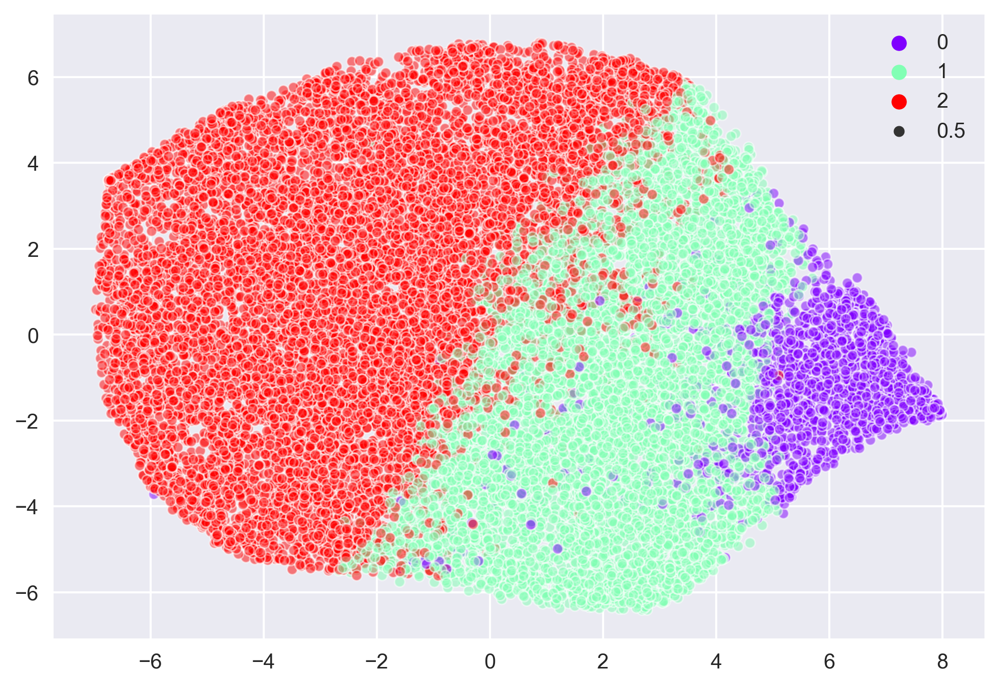

In [204]:
tsne = TSNE(n_components=2, verbose=1, perplexity=92, n_iter=300)
X_ne = tsne.fit_transform(lsa_tfidf_data_sclaed[2000:])

figsize=(20,15)
plt.figure(dpi=300)
sns.scatterplot(X_ne[:, 0], X_ne[:, 1], hue=kmeans.labels_[2000:], alpha=0.5, size = 0.5, palette='rainbow', legend='full');

In [214]:
for i in range(0,k):
    word_list=[]
    print("cluster%d:"% i)
    for j in centers[i,:15]:
        word_list.append(terms[j])
    print(word_list) 

cluster0:
['able wear', 'absolutely', 'able', 'able try', 'absolute']
cluster1:
['able', 'absolute', 'able wear', 'absolutely', 'able try']
cluster2:
['able try', 'absolutely', 'absolute', 'able wear', 'able']


In [249]:
kmeans.labels_

array([4, 0, 3, ..., 0, 0, 4], dtype=int32)

In [219]:
indices_max = [index for index, value in enumerate(kmeans.labels_) if value==0]
for rev_index in indices_max[:5]:
    print(rev_index, str(df.ReviewText[rev_index]))
    print("\n")

21 I'm upset because for the price of the dress, i thought it was embroidered! no, that is a print on the fabric. i think i cried a little when i opened the box. it is still ver pretty. i would say it is true to size, it is a tad bit big on me, but i am very tiny, but i can still get away with it. the color is vibrant. the style is unique. skirt portion is pretty poofy. i keep going back and forth on it mainly because of the price, although the quality is definitely there. except i wish it were emb


41 This is a beautiful top. it's unique and not so ordinary. i bought my usual medium and i found that it fits tight across my chest. although i had a baby this year and i am nursing, so that could be why. if i bought again i would size up.


91 This top is so much prettier in real life than it is on the model. the pattern and texture are both lovely, and the peplum is surprisingly flattering. it is definitely on the short side, but i think that gives it a modern look. the fabric does not 

In [220]:
indices_max = [index for index, value in enumerate(kmeans.labels_) if value==1]
for rev_index in indices_max[:5]:
    print(rev_index, str(df.ReviewText[rev_index]))
    print("\n")

1 Love this dress!  it's sooo pretty.  i happened to find it in a store, and i'm glad i did bc i never would have ordered it online bc it's petite.  i bought a petite and am 5'8".  i love the length on me- hits just a little below the knee.  would definitely be a true midi on someone who is truly petite.


2 I had such high hopes for this dress and really wanted it to work for me. i initially ordered the petite small (my usual size) but i found this to be outrageously small. so small in fact that i could not zip it up! i reordered it in petite medium, which was just ok. overall, the top half was comfortable and fit nicely, but the bottom half had a very tight under layer and several somewhat cheap (net) over layers. imo, a major design flaw was the net over layer sewn directly into the zipper - it c


5 I love tracy reese dresses, but this one is not for the very petite. i am just under 5 feet tall and usually wear a 0p in this brand. this dress was very pretty out of the package but i

In [221]:
indices_max = [index for index, value in enumerate(kmeans.labels_) if value==2]
for rev_index in indices_max[:5]:
    print(rev_index, str(df.ReviewText[rev_index]))
    print("\n")

0 Absolutely wonderful - silky and sexy and comfortable


3 I love, love, love this jumpsuit. it's fun, flirty, and fabulous! every time i wear it, i get nothing but great compliments!


4 This shirt is very flattering to all due to the adjustable front tie. it is the perfect length to wear with leggings and it is sleeveless so it pairs well with any cardigan. love this shirt!!!


6 I aded this in my basket at hte last mintue to see what it would look like in person. (store pick up). i went with teh darkler color only because i am so pale :-) hte color is really gorgeous, and turns out it mathced everythiing i was trying on with it prefectly. it is a little baggy on me and hte xs is hte msallet size (bummer, no petite). i decided to jkeep it though, because as i said, it matvehd everything. my ejans, pants, and the 3 skirts i waas trying on (of which i ]kept all ) oops.


11 This dress is perfection! so pretty and flattering.




# nmf_tfidf

In [223]:
SSEs = []
Sil_coefs = []
for k in range(2,10):
    km = KMeans(n_clusters=k, random_state=42)
    km.fit(nmf_tfidf_data_scaled)
    labels = km.labels_
    Sil_coefs.append(silhouette_score(nmf_tfidf_data_scaled, labels, metric='euclidean'))
    SSEs.append(km.inertia_) 

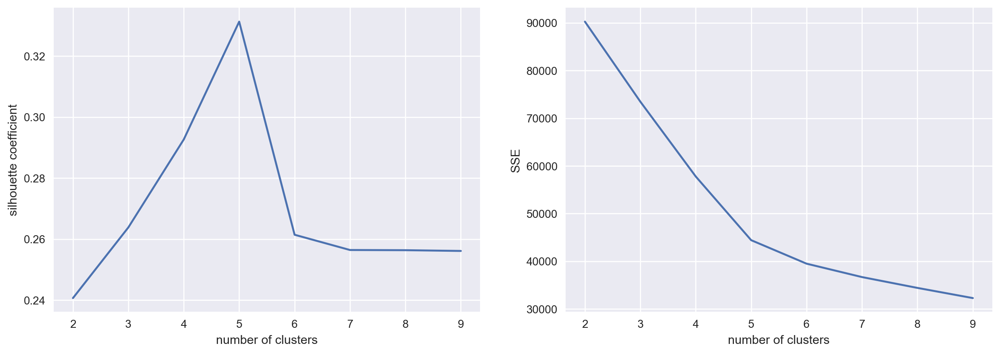

In [224]:
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(15,5), sharex=True, dpi=200)
k_clusters = range(2,10)
ax1.plot(k_clusters, Sil_coefs)
ax1.set_xlabel('number of clusters')
ax1.set_ylabel('silhouette coefficient')

# plot here on ax2
ax2.plot(k_clusters, SSEs)
ax2.set_xlabel('number of clusters')
ax2.set_ylabel('SSE');

In [225]:
inertia = [0,0]

for n_clusters in range(2, 25):
    km = KMeans(n_clusters = n_clusters)
    km.fit(nmf_tfidf_data_scaled)
    msg = f"""# clusters: {n_clusters:2d}   Inertia: {km.inertia_:8.6f}"""
    inertia.append(km.inertia_)
    print(msg)

# clusters:  2   Inertia: 90263.431923
# clusters:  3   Inertia: 73474.463401
# clusters:  4   Inertia: 57778.290875
# clusters:  5   Inertia: 44420.846511
# clusters:  6   Inertia: 39491.281628
# clusters:  7   Inertia: 36679.978047
# clusters:  8   Inertia: 34408.830123
# clusters:  9   Inertia: 32275.031281
# clusters: 10   Inertia: 30341.990425
# clusters: 11   Inertia: 28608.320293
# clusters: 12   Inertia: 27507.810806
# clusters: 13   Inertia: 26150.141830
# clusters: 14   Inertia: 25073.515427
# clusters: 15   Inertia: 24026.918665
# clusters: 16   Inertia: 23130.580472
# clusters: 17   Inertia: 22438.444293
# clusters: 18   Inertia: 21839.944727
# clusters: 19   Inertia: 21201.229151
# clusters: 20   Inertia: 20642.282073
# clusters: 21   Inertia: 20115.736303
# clusters: 22   Inertia: 19559.129451
# clusters: 23   Inertia: 19103.564324
# clusters: 24   Inertia: 18591.183498


Text(0,0.5,'inertia scores')

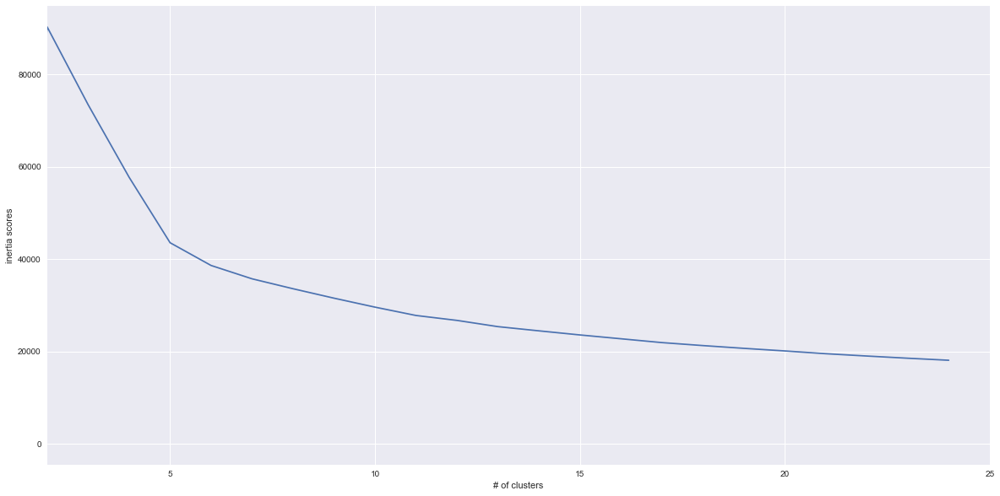

In [255]:
plt.figure(figsize=(20,10))
plt.plot(inertia)
plt.xlabel('# of clusters')
plt.xlim((2,25))
plt.ylabel('inertia scores')
#plt.ylim((650,1200))

In [227]:
# running cluster
k = 5
kmeans = KMeans(n_clusters=k, random_state=1)
kmeans.fit(nmf_tfidf_data_scaled)
centers = kmeans.cluster_centers_.argsort()[:,::-1]
terms = tfidf_vectorizer.get_feature_names()

for i in range(0,k):
    word_list=[]
    print("cluster%d:"% i)
    for j in centers[i,:15]:
        word_list.append(terms[j])
    print(word_list) 

cluster0:
['able try', 'absolutely', 'able wear', 'absolute', 'able']
cluster1:
['absolutely', 'absolute', 'able wear', 'able try', 'able']
cluster2:
['absolute', 'able wear', 'absolutely', 'able try', 'able']
cluster3:
['able', 'absolutely', 'able wear', 'absolute', 'able try']
cluster4:
['able wear', 'absolutely', 'able try', 'absolute', 'able']


[t-SNE] Computing 277 nearest neighbors...
[t-SNE] Indexed 20628 samples in 0.092s...
[t-SNE] Computed neighbors for 20628 samples in 2.030s...
[t-SNE] Computed conditional probabilities for sample 1000 / 20628
[t-SNE] Computed conditional probabilities for sample 2000 / 20628
[t-SNE] Computed conditional probabilities for sample 3000 / 20628
[t-SNE] Computed conditional probabilities for sample 4000 / 20628
[t-SNE] Computed conditional probabilities for sample 5000 / 20628
[t-SNE] Computed conditional probabilities for sample 6000 / 20628
[t-SNE] Computed conditional probabilities for sample 7000 / 20628
[t-SNE] Computed conditional probabilities for sample 8000 / 20628
[t-SNE] Computed conditional probabilities for sample 9000 / 20628
[t-SNE] Computed conditional probabilities for sample 10000 / 20628
[t-SNE] Computed conditional probabilities for sample 11000 / 20628
[t-SNE] Computed conditional probabilities for sample 12000 / 20628
[t-SNE] Computed conditional probabilities for sa

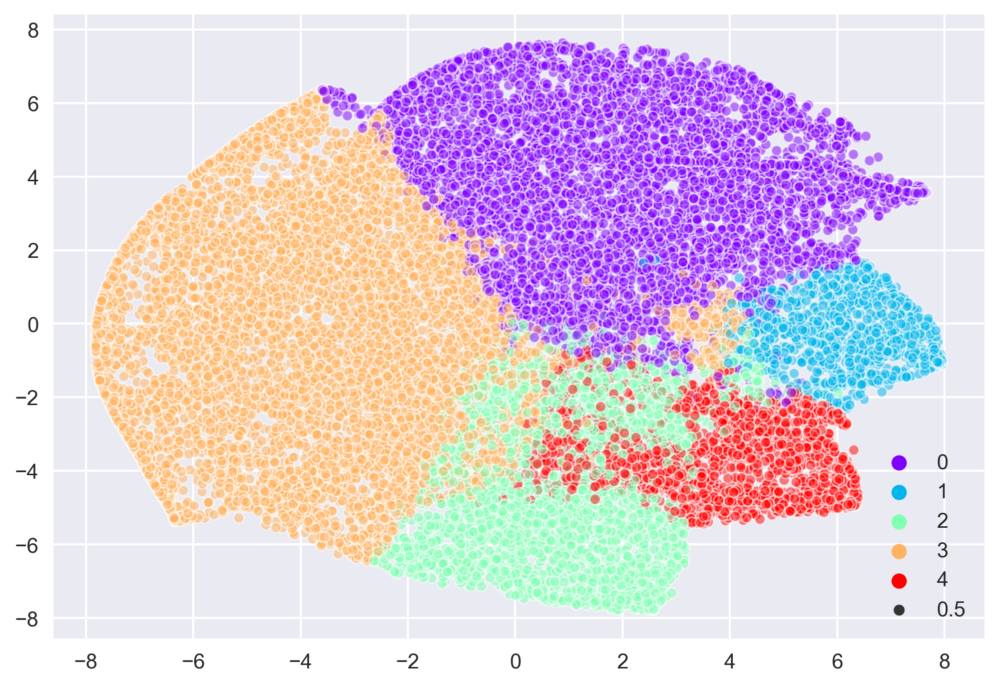

In [228]:
tsne = TSNE(n_components=2, verbose=1, perplexity=92, n_iter=300)
X_ne = tsne.fit_transform(nmf_tfidf_data_scaled[2000:])

figsize=(20,15)
plt.figure(dpi=300)
sns.scatterplot(X_ne[:, 0], X_ne[:, 1], hue=kmeans.labels_[2000:], alpha=0.5, size = 0.5, palette='rainbow', legend='full');

In [229]:
# running cluster
k = 6
kmeans = KMeans(n_clusters=k, random_state=1)
kmeans.fit(nmf_tfidf_data_scaled)
centers = kmeans.cluster_centers_.argsort()[:,::-1]
terms = tfidf_vectorizer.get_feature_names()

for i in range(0,k):
    word_list=[]
    print("cluster%d:"% i)
    for j in centers[i,:15]:
        word_list.append(terms[j])
    print(word_list) 

cluster0:
['absolutely', 'absolute', 'able wear', 'able try', 'able']
cluster1:
['able try', 'able', 'absolutely', 'able wear', 'absolute']
cluster2:
['absolute', 'able wear', 'absolutely', 'able try', 'able']
cluster3:
['able wear', 'absolutely', 'able try', 'absolute', 'able']
cluster4:
['able try', 'absolutely', 'able wear', 'absolute', 'able']
cluster5:
['able', 'absolutely', 'able wear', 'absolute', 'able try']


[t-SNE] Computing 277 nearest neighbors...
[t-SNE] Indexed 20628 samples in 0.105s...
[t-SNE] Computed neighbors for 20628 samples in 2.058s...
[t-SNE] Computed conditional probabilities for sample 1000 / 20628
[t-SNE] Computed conditional probabilities for sample 2000 / 20628
[t-SNE] Computed conditional probabilities for sample 3000 / 20628
[t-SNE] Computed conditional probabilities for sample 4000 / 20628
[t-SNE] Computed conditional probabilities for sample 5000 / 20628
[t-SNE] Computed conditional probabilities for sample 6000 / 20628
[t-SNE] Computed conditional probabilities for sample 7000 / 20628
[t-SNE] Computed conditional probabilities for sample 8000 / 20628
[t-SNE] Computed conditional probabilities for sample 9000 / 20628
[t-SNE] Computed conditional probabilities for sample 10000 / 20628
[t-SNE] Computed conditional probabilities for sample 11000 / 20628
[t-SNE] Computed conditional probabilities for sample 12000 / 20628
[t-SNE] Computed conditional probabilities for sa

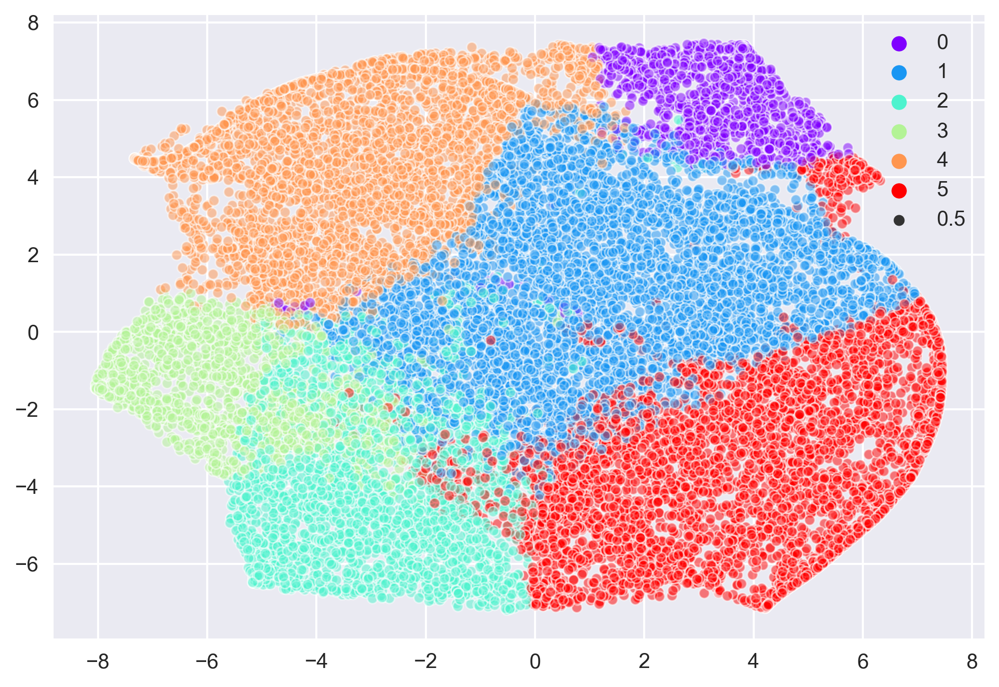

In [230]:
tsne = TSNE(n_components=2, verbose=1, perplexity=92, n_iter=300)
X_ne = tsne.fit_transform(nmf_tfidf_data_scaled[2000:])

figsize=(20,15)
plt.figure(dpi=300)
sns.scatterplot(X_ne[:, 0], X_ne[:, 1], hue=kmeans.labels_[2000:], alpha=0.5, size = 0.5, palette='rainbow', legend='full');

In [235]:
indices_max = [index for index, value in enumerate(kmeans.labels_) if value==3]
for rev_index in indices_max[:5]:
    print(rev_index, str(df.ReviewText[rev_index]))
    print("\n")

21 I'm upset because for the price of the dress, i thought it was embroidered! no, that is a print on the fabric. i think i cried a little when i opened the box. it is still ver pretty. i would say it is true to size, it is a tad bit big on me, but i am very tiny, but i can still get away with it. the color is vibrant. the style is unique. skirt portion is pretty poofy. i keep going back and forth on it mainly because of the price, although the quality is definitely there. except i wish it were emb


41 This is a beautiful top. it's unique and not so ordinary. i bought my usual medium and i found that it fits tight across my chest. although i had a baby this year and i am nursing, so that could be why. if i bought again i would size up.


91 This top is so much prettier in real life than it is on the model. the pattern and texture are both lovely, and the peplum is surprisingly flattering. it is definitely on the short side, but i think that gives it a modern look. the fabric does not 

# more grams

In [236]:
# initialize vectorizers
count_vectorizer = CountVectorizer(ngram_range=(1, 3),  
                                   stop_words='english', 
                                   token_pattern="\\b[a-z][a-z]+\\b",
                                   lowercase=True,
                                   max_df = 0.6, max_features=4000)
tfidf_vectorizer = TfidfVectorizer(ngram_range=(1, 3),  
                                   stop_words='english', 
                                   token_pattern="\\b[a-z][a-z]+\\b",
                                   lowercase=True,
                                   max_df = 0.6, max_features=4000)

# transfomred my text data using vectorizers
cv_data = count_vectorizer.fit_transform(df.ReviewTextLower)
tfidf_data = tfidf_vectorizer.fit_transform(df.ReviewTextLower)

In [237]:
# initialized reducers with dimensions
n_comp = 5
lsa_tfidf = TruncatedSVD(n_components=n_comp)
lsa_cv = TruncatedSVD(n_components=n_comp)
nmf_tfidf = NMF(n_components=n_comp)
nmf_cv = NMF(n_components=n_comp)

# transformed my vectorizers data using reducers
lsa_tfidf_data = lsa_tfidf.fit_transform(tfidf_data)
lsa_cv_data = lsa_cv.fit_transform(cv_data)
nmf_tfidf_data = nmf_tfidf.fit_transform(tfidf_data)
nmf_cv_data = nmf_cv.fit_transform(cv_data)

In [238]:
# initialize standardscaler
from sklearn.preprocessing import StandardScaler
SS = StandardScaler()

# transform my reducer data using standardscaler
lsa_tfidf_data_sclaed = SS.fit_transform(lsa_tfidf_data)
lsa_cv_data_sclaed = SS.fit_transform(lsa_cv_data)
nmf_tfidf_data_scaled = SS.fit_transform(nmf_tfidf_data)
nmf_cv_data_scaled = SS.fit_transform(nmf_cv_data)

In [239]:
SSEs = []
Sil_coefs = []
for k in range(2,10):
    km = KMeans(n_clusters=k, random_state=42)
    km.fit(nmf_tfidf_data_scaled)
    labels = km.labels_
    Sil_coefs.append(silhouette_score(nmf_tfidf_data_scaled, labels, metric='euclidean'))
    SSEs.append(km.inertia_) 

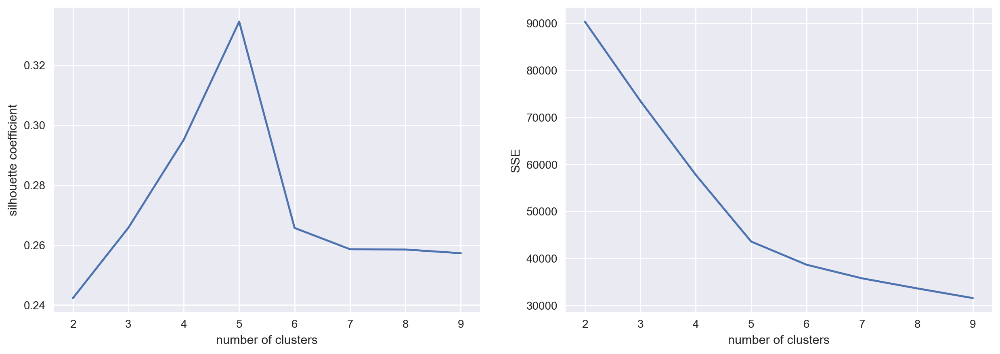

In [240]:
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(15,5), sharex=True, dpi=200)
k_clusters = range(2,10)
ax1.plot(k_clusters, Sil_coefs)
ax1.set_xlabel('number of clusters')
ax1.set_ylabel('silhouette coefficient')

# plot here on ax2
ax2.plot(k_clusters, SSEs)
ax2.set_xlabel('number of clusters')
ax2.set_ylabel('SSE');

In [241]:
inertia = [0,0]

for n_clusters in range(2, 25):
    km = KMeans(n_clusters = n_clusters)
    km.fit(nmf_tfidf_data_scaled)
    msg = f"""# clusters: {n_clusters:2d}   Inertia: {km.inertia_:8.6f}"""
    inertia.append(km.inertia_)
    print(msg)

# clusters:  2   Inertia: 90338.984804
# clusters:  3   Inertia: 73482.227460
# clusters:  4   Inertia: 57759.730141
# clusters:  5   Inertia: 43570.035756
# clusters:  6   Inertia: 38642.495455
# clusters:  7   Inertia: 35750.623578
# clusters:  8   Inertia: 33599.948861
# clusters:  9   Inertia: 31554.894180
# clusters: 10   Inertia: 29611.302321
# clusters: 11   Inertia: 27805.735090
# clusters: 12   Inertia: 26737.903024
# clusters: 13   Inertia: 25385.570846
# clusters: 14   Inertia: 24474.577757
# clusters: 15   Inertia: 23586.923368
# clusters: 16   Inertia: 22757.422779
# clusters: 17   Inertia: 21928.717501
# clusters: 18   Inertia: 21282.148283
# clusters: 19   Inertia: 20684.113418
# clusters: 20   Inertia: 20119.370720
# clusters: 21   Inertia: 19518.804959
# clusters: 22   Inertia: 19017.209461
# clusters: 23   Inertia: 18540.845862
# clusters: 24   Inertia: 18097.930785


Text(0,0.5,'inertia scores')

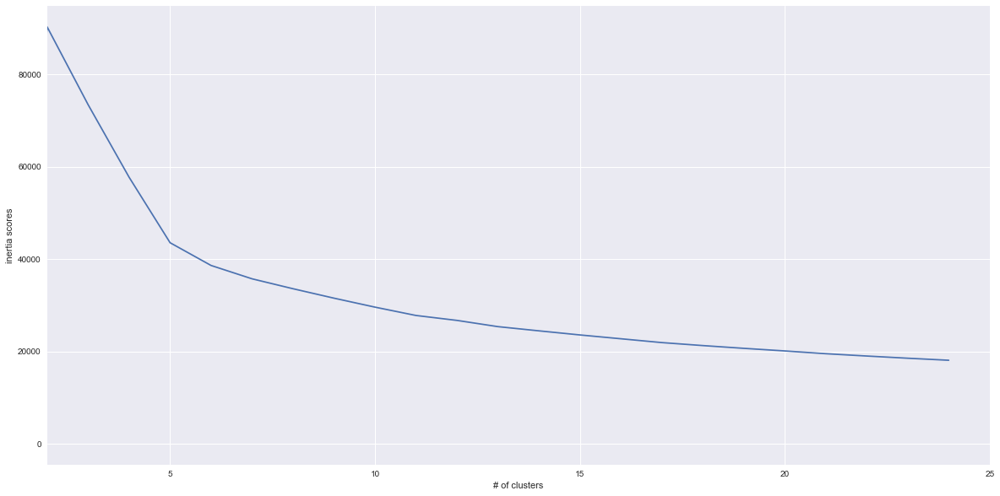

In [256]:
plt.figure(figsize=(20,10))
plt.plot(inertia)
plt.xlabel('# of clusters')
plt.xlim((2,25))
plt.ylabel('inertia scores')
#plt.ylim((650,1200))

In [244]:
# running cluster
k = 5
kmeans = KMeans(n_clusters=k, random_state=42)
kmeans.fit(nmf_tfidf_data_scaled)
centers = kmeans.cluster_centers_.argsort()[:,::-1]
terms = tfidf_vectorizer.get_feature_names()

for i in range(0,k):
    word_list=[]
    print("cluster%d:"% i)
    for j in centers[i,:15]:
        word_list.append(terms[j])
    print(word_list) 

cluster0:
['able', 'absolutely', 'able wear', 'absolute', 'able try']
cluster1:
['absolutely', 'absolute', 'able wear', 'able try', 'able']
cluster2:
['able wear', 'able try', 'absolutely', 'absolute', 'able']
cluster3:
['absolute', 'able wear', 'absolutely', 'able try', 'able']
cluster4:
['able try', 'absolutely', 'able wear', 'absolute', 'able']


[t-SNE] Computing 277 nearest neighbors...
[t-SNE] Indexed 20628 samples in 0.093s...
[t-SNE] Computed neighbors for 20628 samples in 2.066s...
[t-SNE] Computed conditional probabilities for sample 1000 / 20628
[t-SNE] Computed conditional probabilities for sample 2000 / 20628
[t-SNE] Computed conditional probabilities for sample 3000 / 20628
[t-SNE] Computed conditional probabilities for sample 4000 / 20628
[t-SNE] Computed conditional probabilities for sample 5000 / 20628
[t-SNE] Computed conditional probabilities for sample 6000 / 20628
[t-SNE] Computed conditional probabilities for sample 7000 / 20628
[t-SNE] Computed conditional probabilities for sample 8000 / 20628
[t-SNE] Computed conditional probabilities for sample 9000 / 20628
[t-SNE] Computed conditional probabilities for sample 10000 / 20628
[t-SNE] Computed conditional probabilities for sample 11000 / 20628
[t-SNE] Computed conditional probabilities for sample 12000 / 20628
[t-SNE] Computed conditional probabilities for sa

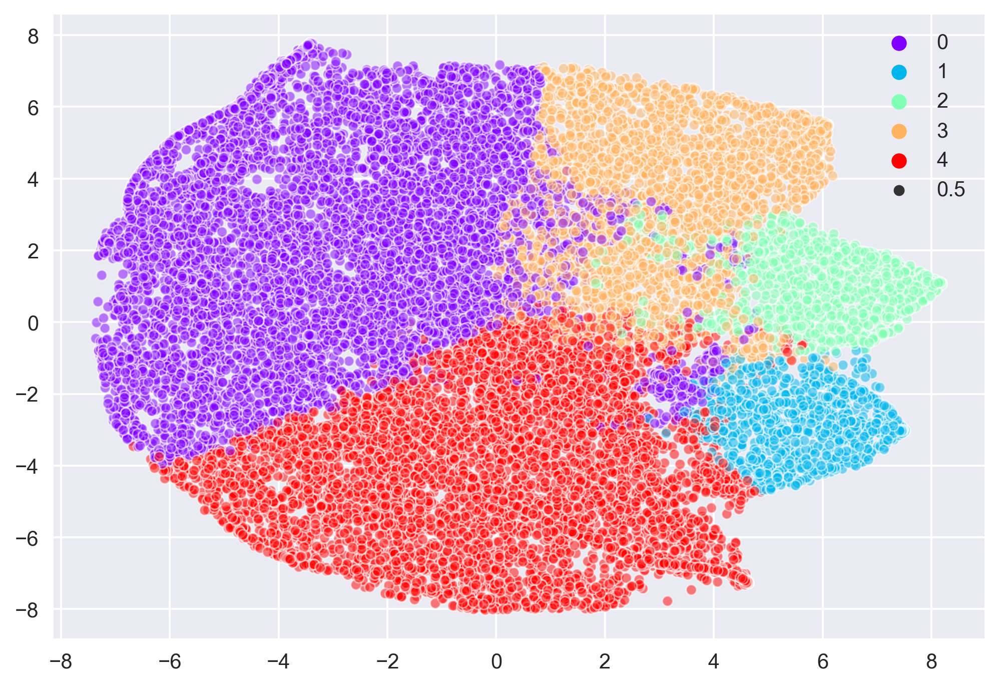

In [245]:
tsne = TSNE(n_components=2, verbose=1, perplexity=92, n_iter=300, random_state=42)
X_ne = tsne.fit_transform(nmf_tfidf_data_scaled[2000:])

figsize=(20,15)
plt.figure(dpi=300)
sns.scatterplot(X_ne[:, 0], X_ne[:, 1], hue=kmeans.labels_[2000:], alpha=0.5, size = 0.5, palette='rainbow', legend='full');

In [250]:
indices_max = [index for index, value in enumerate(kmeans.labels_) if value==0]
for rev_index in indices_max[:5]:
    print(rev_index, str(df.ReviewText[rev_index]))
    print("\n")

1 Love this dress!  it's sooo pretty.  i happened to find it in a store, and i'm glad i did bc i never would have ordered it online bc it's petite.  i bought a petite and am 5'8".  i love the length on me- hits just a little below the knee.  would definitely be a true midi on someone who is truly petite.


5 I love tracy reese dresses, but this one is not for the very petite. i am just under 5 feet tall and usually wear a 0p in this brand. this dress was very pretty out of the package but its a lot of dress. the skirt is long and very full so it overwhelmed my small frame. not a stranger to alterations, shortening and narrowing the skirt would take away from the embellishment of the garment. i love the color and the idea of the style but it just did not work on me. i returned this dress.


6 I aded this in my basket at hte last mintue to see what it would look like in person. (store pick up). i went with teh darkler color only because i am so pale :-) hte color is really gorgeous, and 

In [251]:
indices_max = [index for index, value in enumerate(kmeans.labels_) if value==3]
for rev_index in indices_max[:5]:
    print(rev_index, str(df.ReviewText[rev_index]))
    print("\n")

2 I had such high hopes for this dress and really wanted it to work for me. i initially ordered the petite small (my usual size) but i found this to be outrageously small. so small in fact that i could not zip it up! i reordered it in petite medium, which was just ok. overall, the top half was comfortable and fit nicely, but the bottom half had a very tight under layer and several somewhat cheap (net) over layers. imo, a major design flaw was the net over layer sewn directly into the zipper - it c


8 I love this dress. i usually get an xs but it runs a little snug in bust so i ordered up a size. very flattering and feminine with the usual retailer flair for style.


9 I'm 5"5' and 125 lbs. i ordered the s petite to make sure the length wasn't too long. i typically wear an xs regular in retailer dresses. if you're less busty (34b cup or smaller), a s petite will fit you perfectly (snug, but not tight). i love that i could dress it up for a party, or down for work. i love that the tulle